In [1]:
import sys
sys.path.insert(0, '/home/ading/dev/empirical-mt')
sys.path.insert(0, '/home/ading/dev/pyflow/')

import matplotlib.pyplot as plt

from pelic.gabors import makeGabors, makeGaussian
from pelic.calculate_contrast import CalculateContrast

import pandas as pd

from tqdm import tqdm 

from tuning import DirectionTuning, SpeedTuning, DisparityTuning

import numpy as np

from skimage import io, transform, util, img_as_float, img_as_ubyte, img_as_float64
from skimage.color import rgb2gray, gray2rgb
from skimage.transform import resize
import skimage.draw as draw

import scipy.io as sio

import MT

from keras.layers import Input, Dense, Concatenate, Multiply
from keras.models import Model

import tensorflow as tf

from os import listdir
from os.path import isfile, join, split, isdir, basename

from scipy import stats

import cv2

import pyflow

from visual_tracking.data_pipline.speed_direction_saliency_input import SpeedDirectionSaliencySeqInputFunc

import pyimgsaliency as psal

/usr/local/lib/python2.7/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


/home/ading/.local/lib/python2.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:80: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


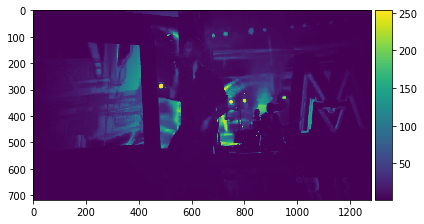

In [2]:
#f1 = io.imread('../input/ALOV300++/imagedata++/01-Light/01-Light_video00001/00000001.jpg')

f2 =  io.imread('../input/ALOV300++/imagedata++/01-Light/01-Light_video00004/00000006.jpg')

io.imshow(f2)

saliency = psal.get_saliency_mbd(f2)

io.imshow(saliency)

plt.show()

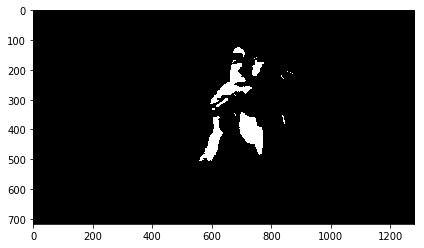

In [19]:
saliency = saliency.astype('uint8')
threshMap = cv2.threshold(saliency, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

io.imshow(threshMap)

In [14]:
saliency.astype(np.ubyte)

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ..., 
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [29]:
psal.get_saliency_mbd(f2)

Input type is neither list or string


In [24]:
f2.dtype

dtype('uint8')

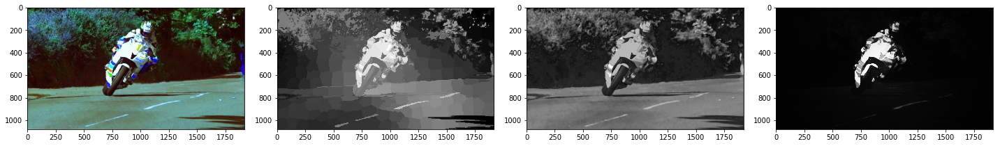

In [20]:
filename='../input/ALOV300++/imagedata++/01-Light/01-Light_video00005/00000006.jpg'

ft = psal.get_saliency_ft(filename).astype('uint8')
rbd = psal.get_saliency_rbd(filename).astype('uint8')
ft = psal.get_saliency_ft(filename).astype('uint8')
mbd = psal.get_saliency_mbd(filename).astype('uint8')

binary_sal = psal.binarise_saliency_map(rbd,method='adaptive')

img = cv2.imread(filename)

plt.figure(figsize=(20, 20))

plt.subplot(1, 4, 1)
io.imshow(img)

plt.subplot(1, 4, 2)
io.imshow(rbd)

plt.subplot(1, 4, 3)
io.imshow(ft)

plt.subplot(1, 4, 4)
io.imshow(mbd)

plt.show()

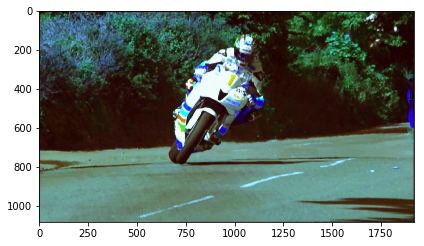

In [21]:
io.imshow(img)

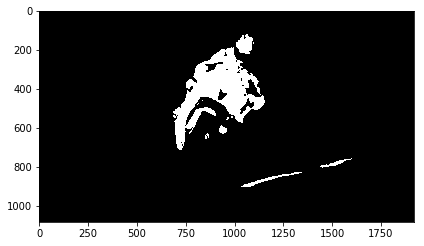

In [22]:
io.imshow(binary_sal)

In [17]:
f2.dtype

dtype('uint8')

In [11]:
saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
(success, saliencyMap) = saliency.computeSaliency(f2)

In [14]:
saliency = cv2.saliency.StaticSaliencyFineGrained_create()
(success, saliencyMap) = saliency.computeSaliency(f2)

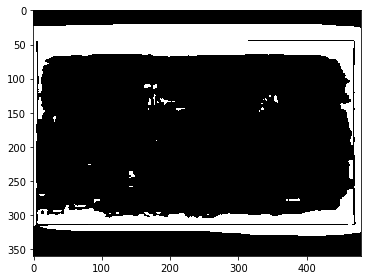

In [15]:
threshMap = cv2.threshold(saliencyMap, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

io.imshow(threshMap)

In [2]:
ne = SpeedDirectionSaliencySeqInputFunc(dataset_index_filepath='../data/alov300++/alov300_train.csv',
                                input_folderpath='../',
                                batch_size=60, 
                                k=3,
                                flow_method='fb',
                                #saliency_method='mb',
                                cache_folderpath=None,
                                cache_id=None,
                                saliencymaps_folderpath='saliencymaps',
                                n_workers=8, 
                                fixed_input_dim=256, 
                                num_epochs=1,
                                shuffle=False)()

input pipline initilized, input_shpae=({'direction': TensorShape([Dimension(None), Dimension(5), Dimension(256), Dimension(256)]), 'speed_tents': TensorShape([Dimension(None), Dimension(5), Dimension(256), Dimension(256), Dimension(10)]), 'saliency': TensorShape([Dimension(None), Dimension(5), Dimension(256), Dimension(256)]), 'num_seqs_in_video': TensorShape([Dimension(None)]), 'bbox': TensorShape([Dimension(None), Dimension(4)]), 'frames': TensorShape([Dimension(None), Dimension(6), Dimension(256), Dimension(256), Dimension(3)]), 'speed': TensorShape([Dimension(None), Dimension(5), Dimension(256), Dimension(256)])}, TensorShape([Dimension(None), Dimension(4)])), input_dtype=({'direction': tf.float32, 'speed_tents': tf.float32, 'saliency': tf.float32, 'num_seqs_in_video': tf.int32, 'bbox': tf.float32, 'frames': tf.float32, 'speed': tf.float32}, tf.float32)


In [3]:
rs = []

with tf.Session(config=tf.ConfigProto(device_count={'GPU': 0})) as sess:
    i = 0
    while i < 1:
        i = i + 1
        try:
            r = sess.run(ne)
        except tf.errors.OutOfRangeError:
            break
        
        print(i)

INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000890.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000891.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000892.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000893.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000894.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000895.jpg from grayscale to rgb


/home/ading/.local/lib/python2.7/site-packages/skimage/transform/_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/ading/.local/lib/python2.7/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/home/ading/.local/lib/python2.7/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003085.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003086.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003087.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003088.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003089.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003090.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000630.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/im

/home/ading/.local/lib/python2.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:80: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


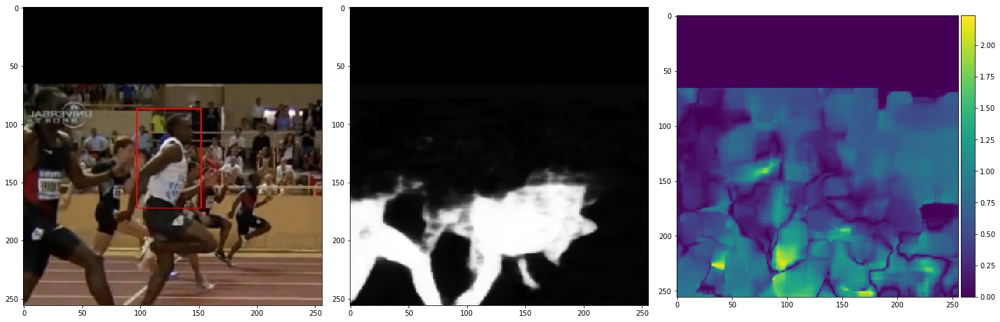

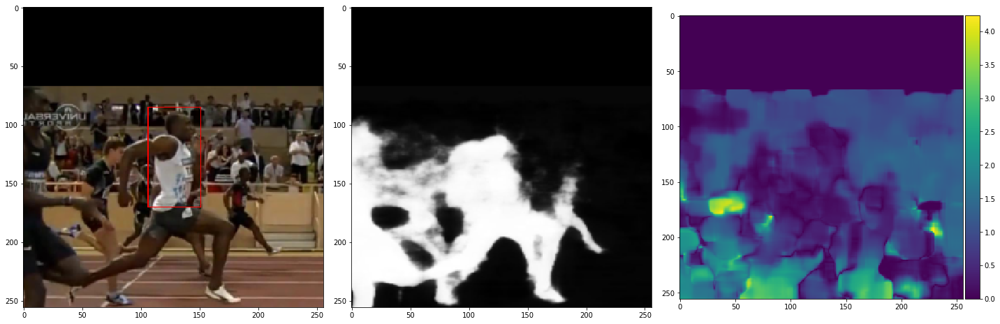

/home/ading/.local/lib/python2.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


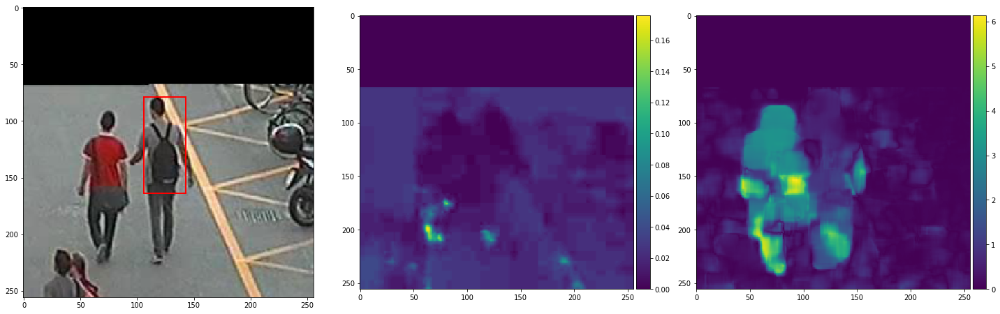

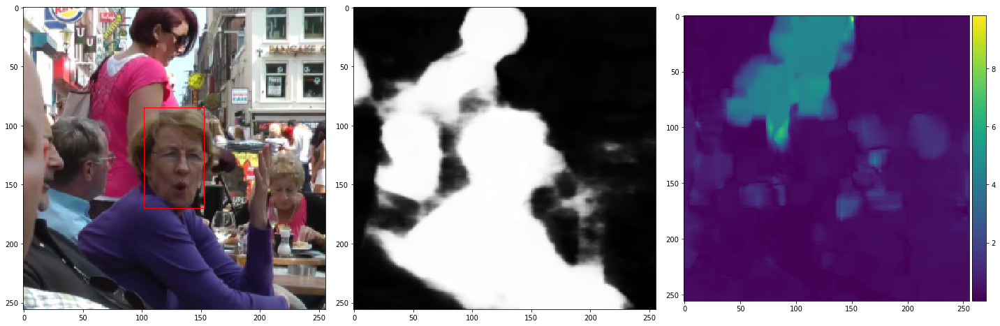

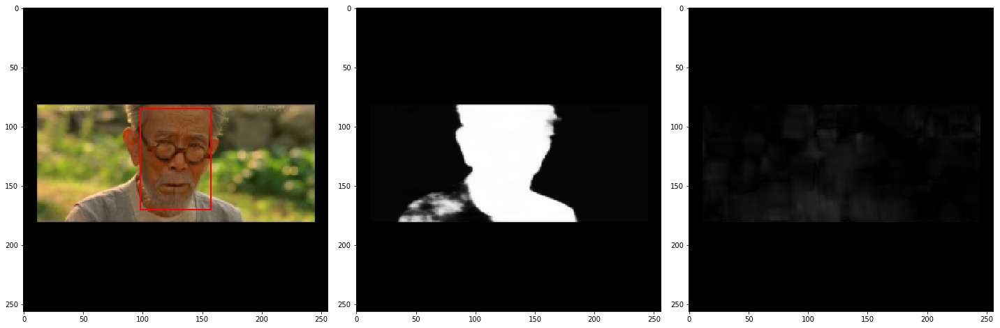

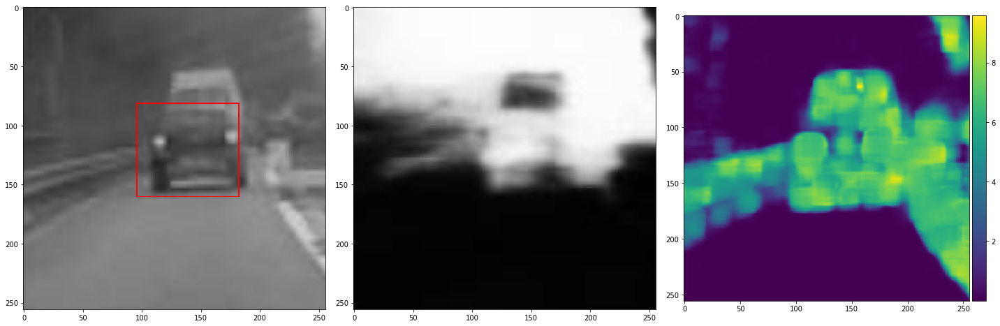

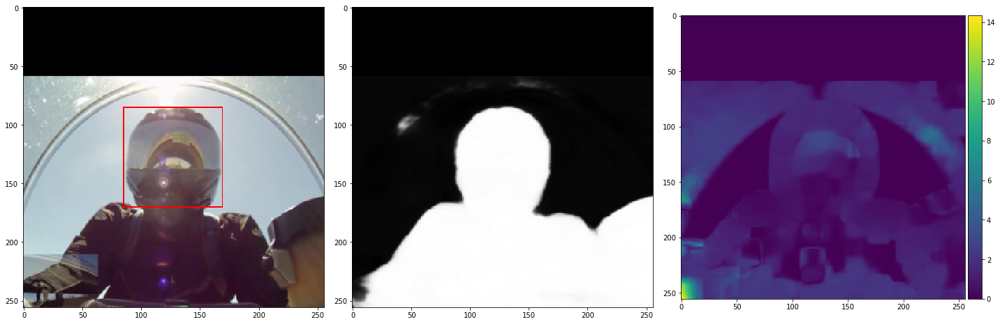

...

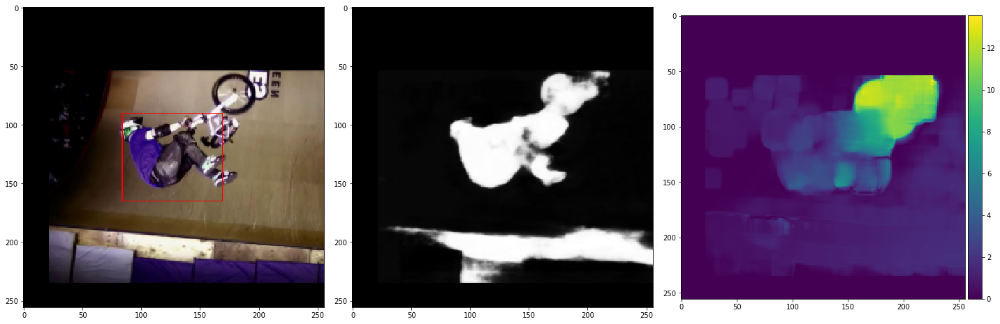

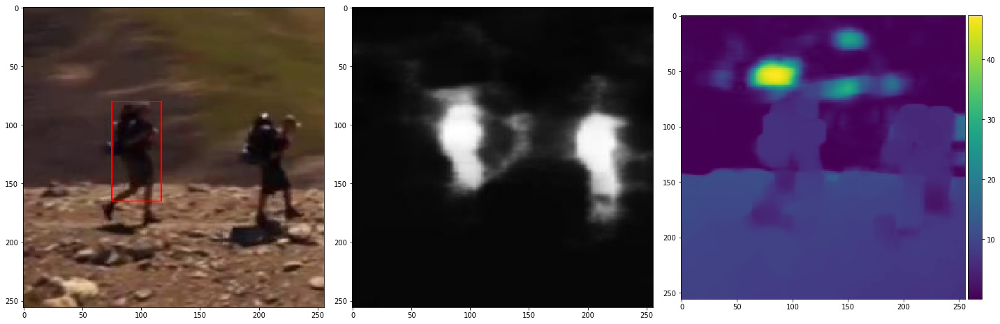

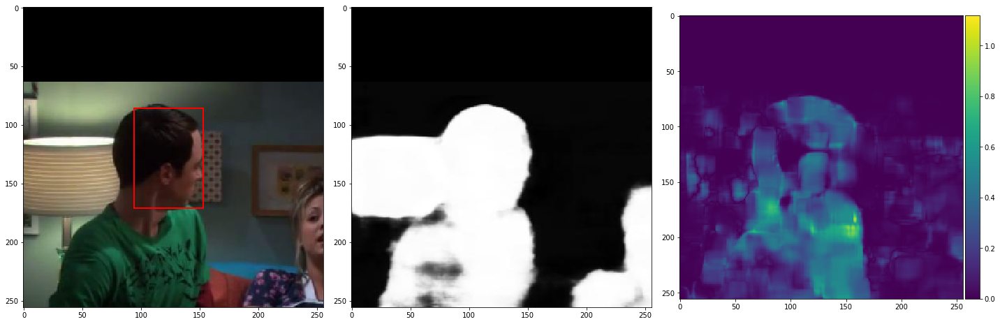

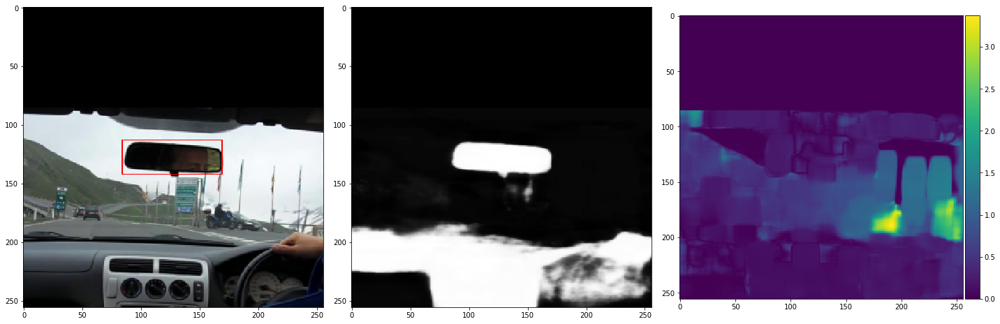

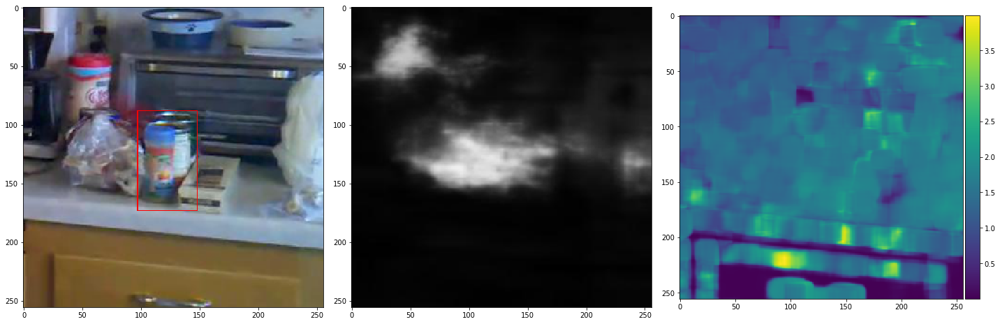

INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003055.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003056.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003057.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003058.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003059.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00003060.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/imagedata++/14-LongDuration/14-LongDuration_video00002/00000840.jpg from grayscale to rgb
INFO:tensorflow:converting ../input/ALOV300++/im

In [4]:
for i in range(0 ,60):
    plt.figure(figsize=(20, 20))
    
    #plt.subplot(1 ,3, 1)
    #f1 = r[0]['frames'][i, 0, :, :, :]
    #v1_y, v1_x, v2_y, v2_x = (r[0]['bbox'][i, :] * 127).astype(np.int32)
    #cv2.rectangle(f1, (v1_x, v1_y), (v2_x, v2_y), color=1, thickness=1)
    #io.imshow(f1)

    plt.subplot(1 ,3, 1)
    f2 = r[0]['frames'][i, -1, :, :, :]
    v1_y, v1_x, v2_y, v2_x = (r[1][i, :] * 255).astype(np.int32)
    cv2.rectangle(f2, (v1_x, v1_y), (v2_x, v2_y), color=1, thickness=1)
    io.imshow(f2)
    
    plt.subplot(1, 3, 2)
    s = r[0]['saliency'][i, -1, :, :]
    io.imshow(s)
    
    plt.subplot(1, 3, 3)
    f = r[0]['speed'][i, -1, :, :]
    io.imshow(f)
    
    plt.show()

In [5]:
np.reshape(np.array([1, 2, 3, 4]), [2, 2])

array([[1, 2],
       [3, 4]])

In [2]:
np.expand_dims([1,2,3 ], axis=1)

array([[1],
       [2],
       [3]])